<h1 style="font-size: 50px; color:#4d88ff;text-align: center;
">Life Expectancy (WHO)</h1>

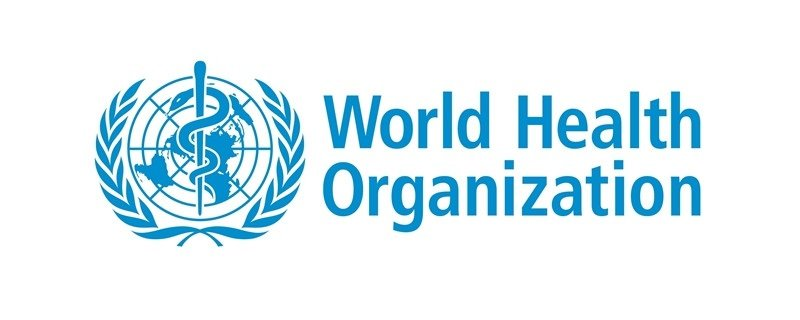

The project relies on accuracy of data. The Global Health Observatory (GHO) data repository under World Health Organization (WHO) keeps track of the health status as well as many other related factors for all countries The data-sets are made available to public for the purpose of health data analysis. The data-set related to life expectancy, health factors for 193 countries has been collected from the same WHO data repository website and its corresponding economic data was collected from United Nation website. Among all categories of health-related factors only those critical factors were chosen which are more representative. It has been observed that in the past 15 years , there has been a huge development in health sector resulting in improvement of human mortality rates especially in the developing nations in comparison to the past 30 years. Therefore, in this project we have considered data from year 2000-2015 for 193 countries for further analysis. The individual data files have been merged together into a single data-set. On initial visual inspection of the data showed some missing values. As the data-sets were from WHO, we found no evident errors. Missing data was handled in R software by using Missmap command. The result indicated that most of the missing data was for population, Hepatitis B and GDP. The missing data were from less known countries like Vanuatu, Tonga, Togo, Cabo Verde etc. Finding all data for these countries was difficult and hence, it was decided that we exclude these countries from the final model data-set. The final merged file(final dataset) consists of 22 Columns and 2938 rows which meant 20 predicting variables. All predicting variables was then divided into several broad categories:​Immunization related factors, Mortality factors, Economical factors and Social factors.From this data i want to find out that wheather there is any correlation existing between the column life expectancy and other datas present in the dataset.

### Importing libraries

In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
import klib as k
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.preprocessing import LabelEncoder, RobustScaler,StandardScaler,MinMaxScaler
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor,AdaBoostRegressor
from sklearn.svm import LinearSVR

### Firstly Load Data

In [2]:
df=pd.read_csv('./Life Expectancy Data.csv')
df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


### Find the datatypes of Each columns

In [3]:
df.dtypes

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
infant deaths                        int64
Alcohol                            float64
percentage expenditure             float64
Hepatitis B                        float64
Measles                              int64
 BMI                               float64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
GDP                                float64
Population                         float64
 thinness  1-19 years              float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object

### Find the shape of the dataset

In [4]:
df.shape

(2938, 22)

### Finding the statistical measures

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Life expectancy,2928.0,6.922493e+01,9.523867e+00,36.30000,63.100000,7.210000e+01,7.570000e+01,8.900000e+01
Adult Mortality,2928.0,1.647964e+02,1.242921e+02,1.00000,74.000000,1.440000e+02,2.280000e+02,7.230000e+02
infant deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2744.0,4.602861e+00,4.052413e+00,0.01000,0.877500,3.755000e+00,7.702500e+00,1.787000e+01
percentage expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis B,2385.0,8.094046e+01,2.507002e+01,1.00000,77.000000,9.200000e+01,9.700000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2904.0,3.832125e+01,2.004403e+01,1.00000,19.300000,4.350000e+01,5.620000e+01,8.730000e+01
under-five deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


### Check wheather any null values are present

In [6]:
df.isnull().mean()*100

Country                             0.000000
Year                                0.000000
Status                              0.000000
Life expectancy                     0.340368
Adult Mortality                     0.340368
infant deaths                       0.000000
Alcohol                             6.603131
percentage expenditure              0.000000
Hepatitis B                        18.822328
Measles                             0.000000
 BMI                                1.157250
under-five deaths                   0.000000
Polio                               0.646698
Total expenditure                   7.692308
Diphtheria                          0.646698
 HIV/AIDS                           0.000000
GDP                                15.248468
Population                         22.191967
 thinness  1-19 years               1.157250
 thinness 5-9 years                 1.157250
Income composition of resources     5.684139
Schooling                           5.547992
dtype: flo

### Drop all null values in the dataset

In [7]:
df.dropna(inplace=True)

<h1 style="font-size: 35px; color:#ff884d;text-align: center;
">EXPLORATORY DATA ANALYSIS</h1>

<h1 style="font-size: 25px; color:#000000;text-align: center;
">UNIVARIATE ANALYSIS</h1>

### Firstly i used Histplot to check univariate analyzis

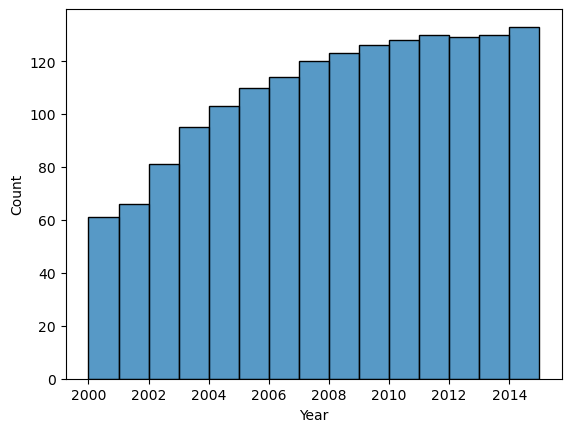

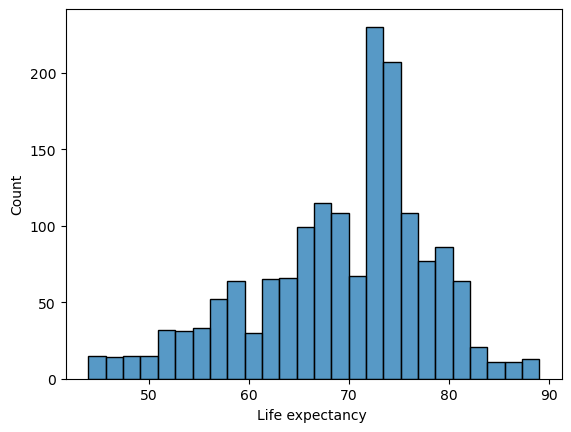

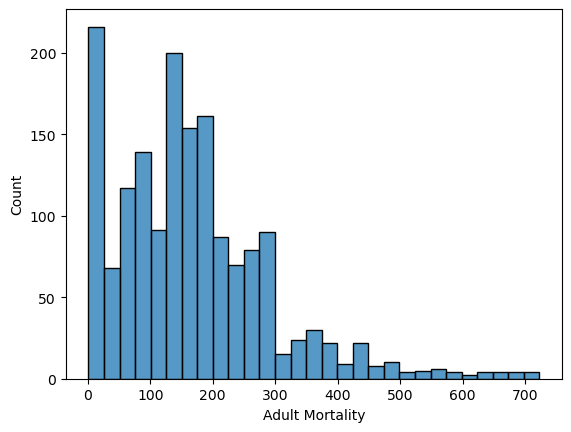

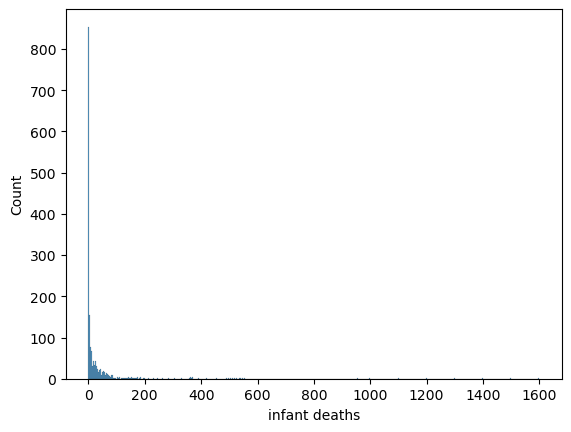

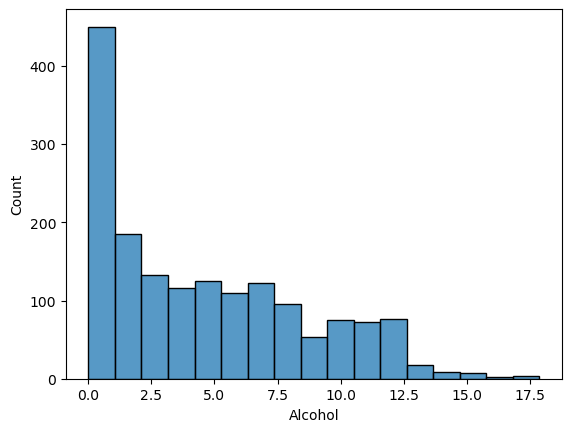

...

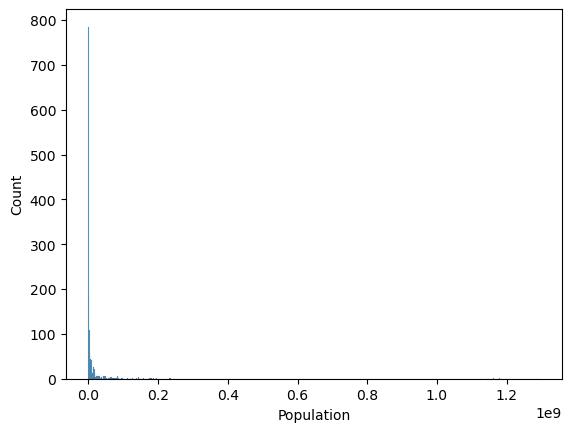

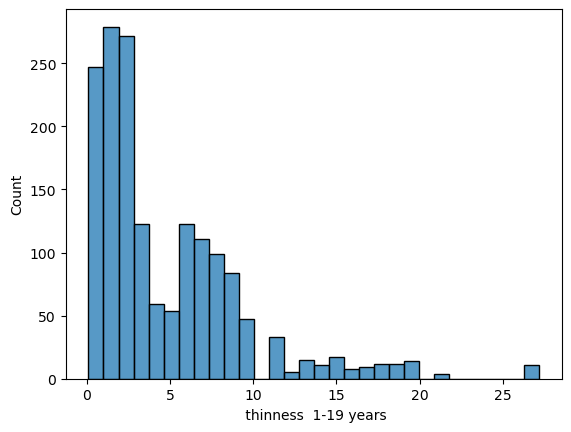

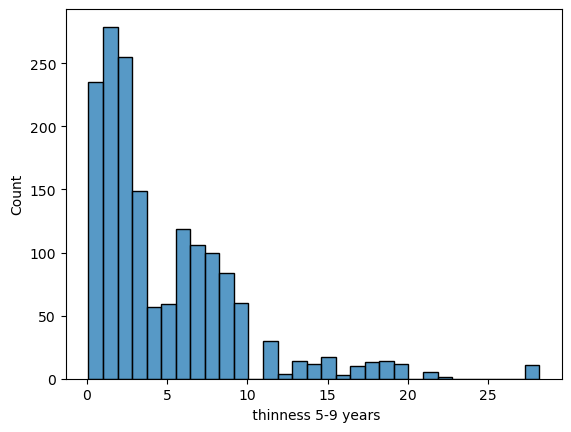

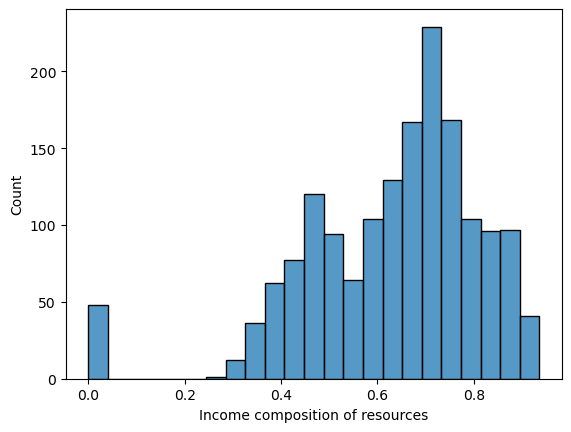

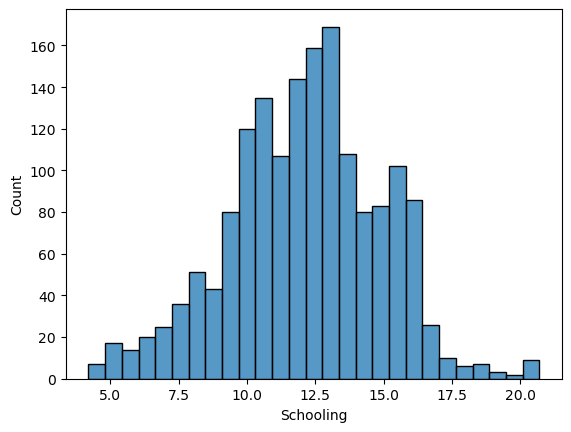

In [8]:
for i in df.columns:
    if df[i].dtypes !='object':
        sns.histplot(x=df[i])
        plt.show()

### Then  i used kdeplot

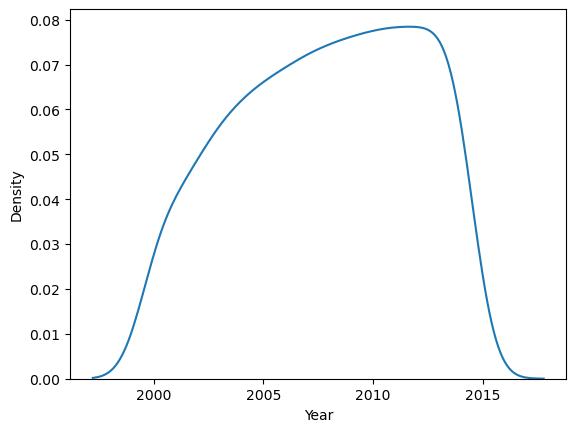

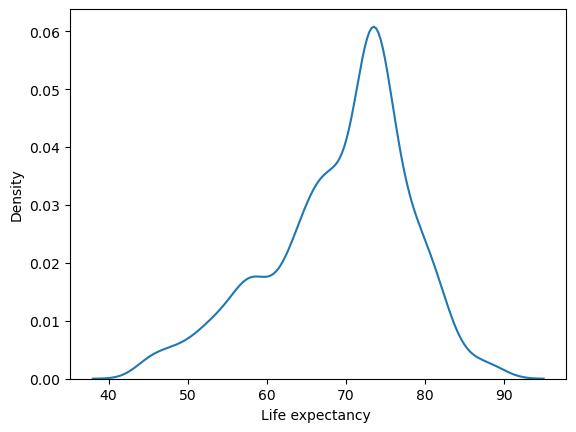

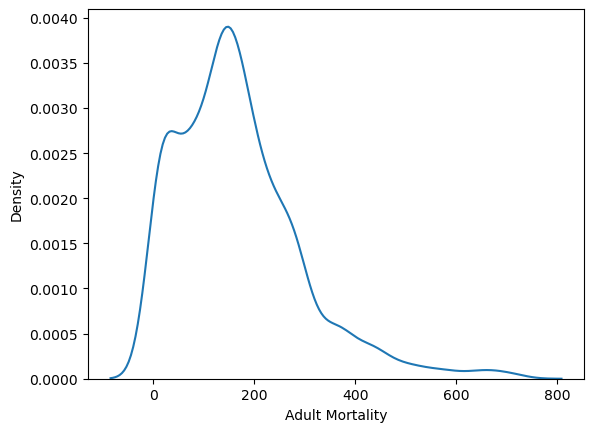

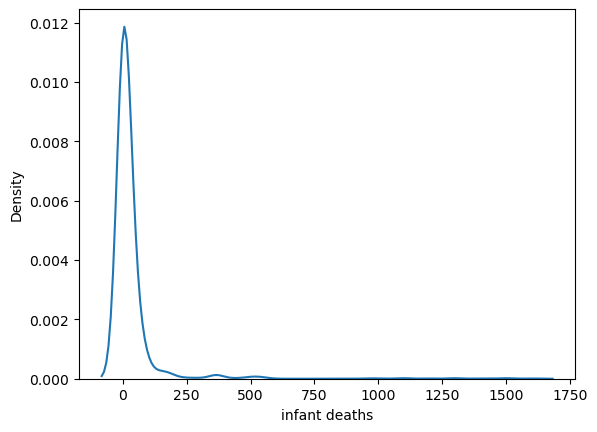

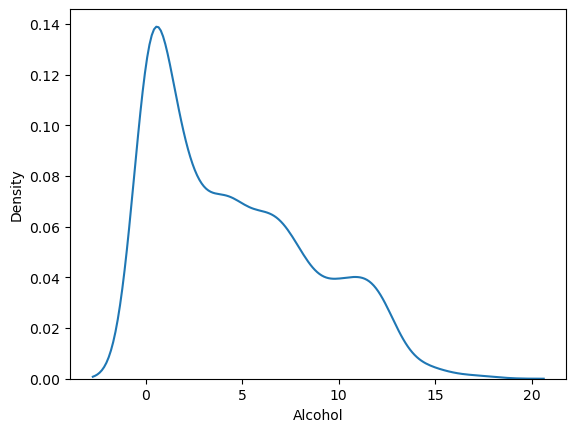

...

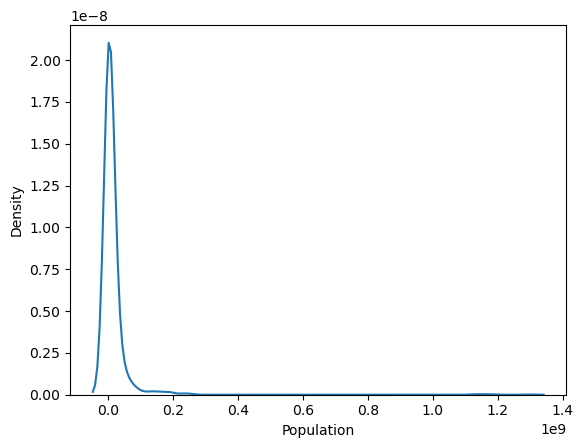

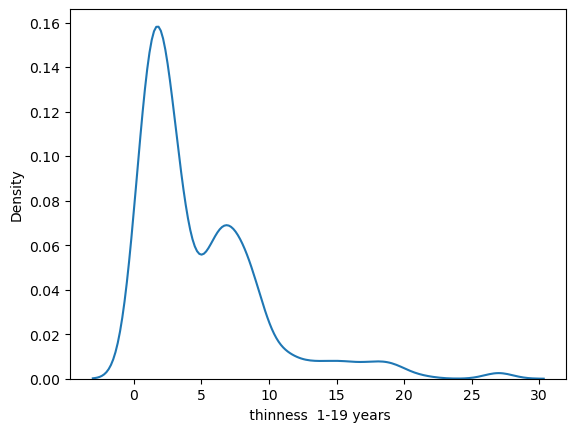

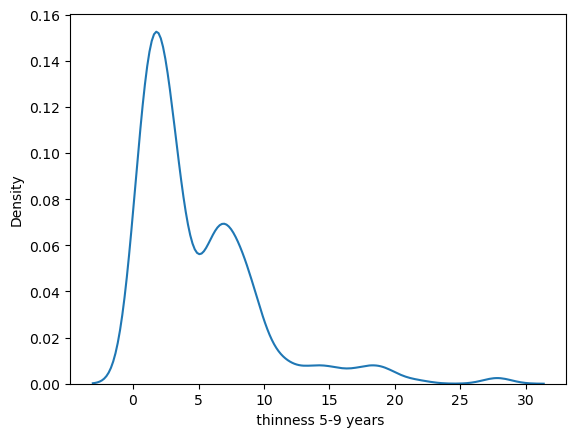

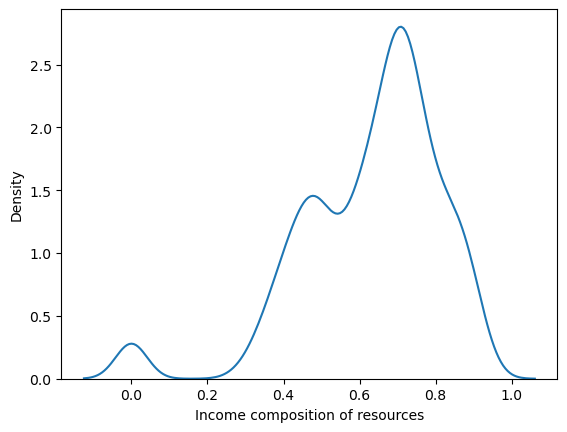

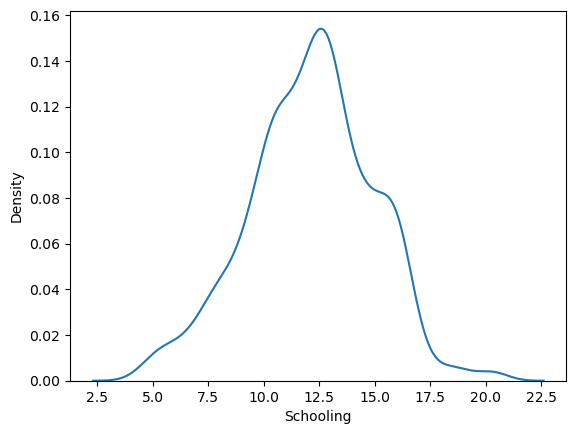

In [9]:
for i in df.columns:
    if df[i].dtypes !='object':
        sns.kdeplot(x=df[i])
        plt.show()
    

### After that i used boxplot to check wheather there is any null values are present in the data set

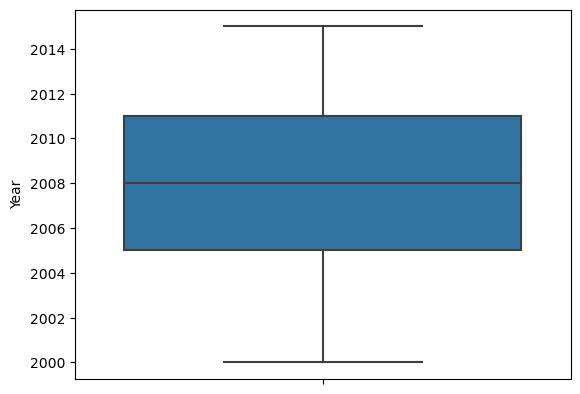

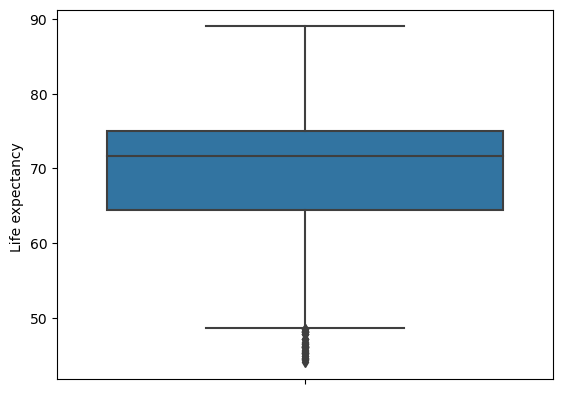

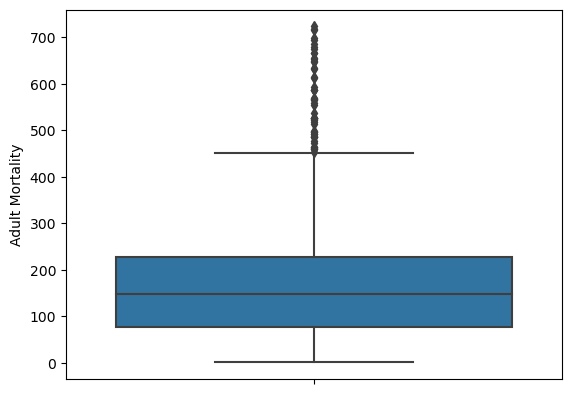

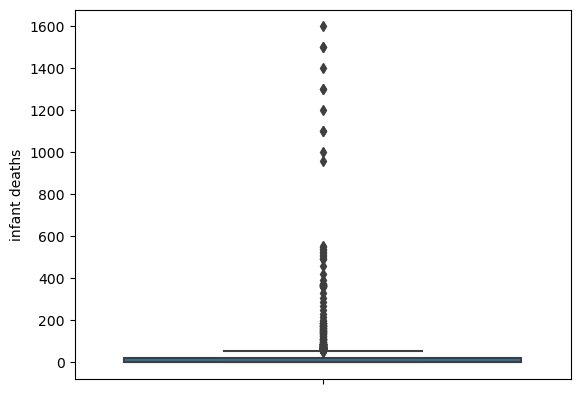

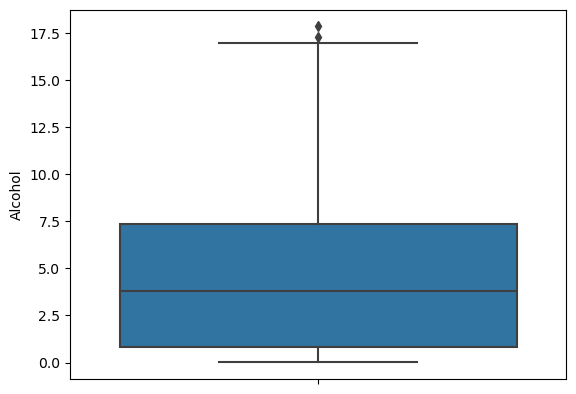

...

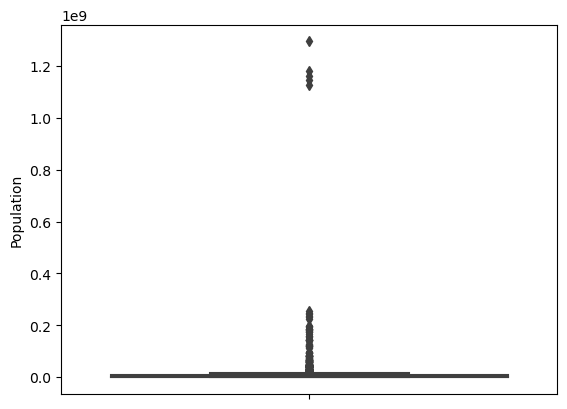

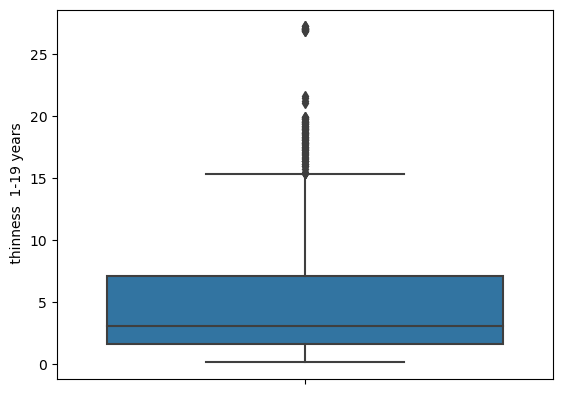

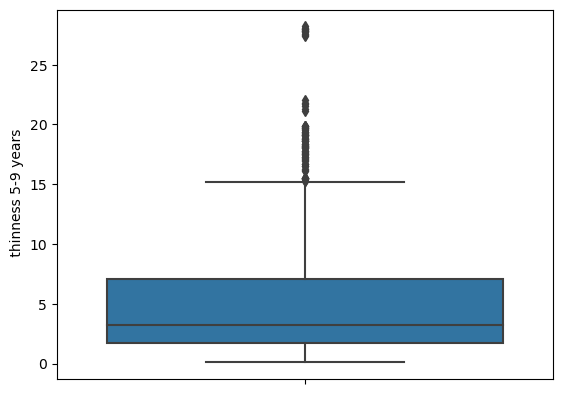

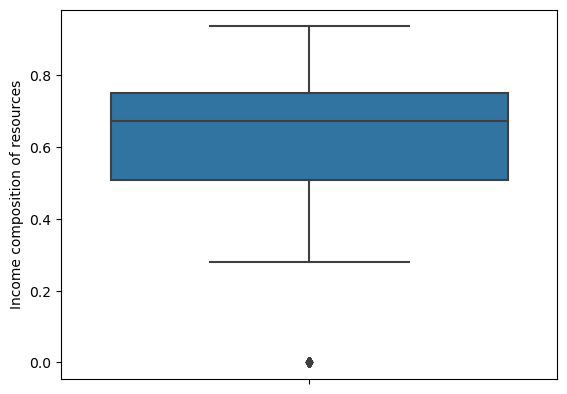

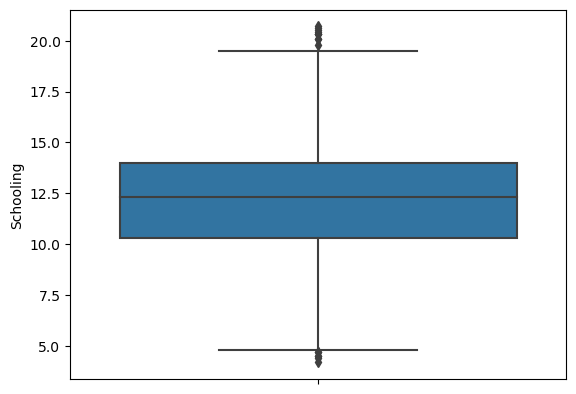

In [10]:
for i in df.columns:
    if df[i].dtypes !='object':
        sns.boxplot(y=df[i])
        plt.show()

### From the above figure i find out there are outliers present in the data set so i use outlier treatment method to remove the maximum number of outliers

In [11]:
def outlier_limit(col):
    Q3,Q1 = np.nanpercentile(col,[75,25])
    IQR=Q3-Q1
    UL=Q3+1.5*IQR
    LL=Q1-1.5*IQR
    return UL,LL

In [12]:
for column in df.columns:
    if df[column].dtypes !="object":
            UL,LL=outlier_limit(df[i])
            df[i]=np.where((df[i]>UL) | (df[i]<LL),np.nan,df[i])

### Then again  i redraw the boxplot to recheck outliers

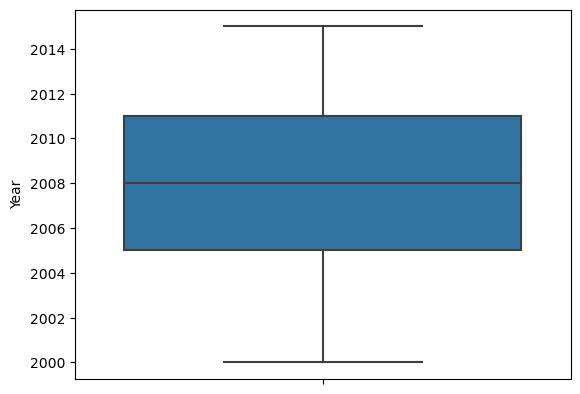

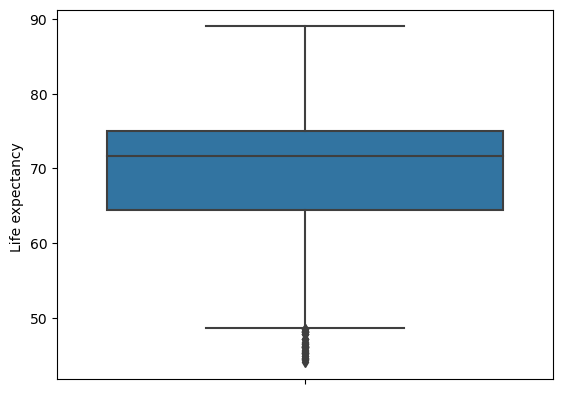

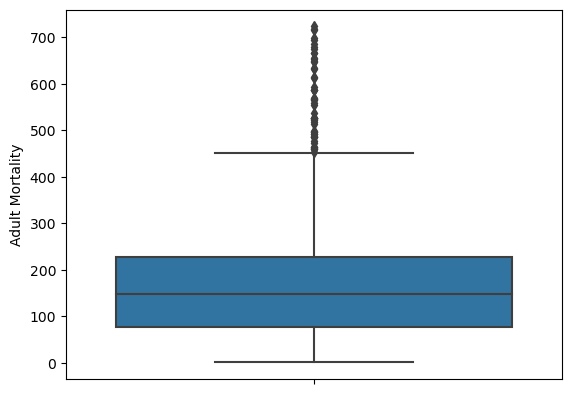

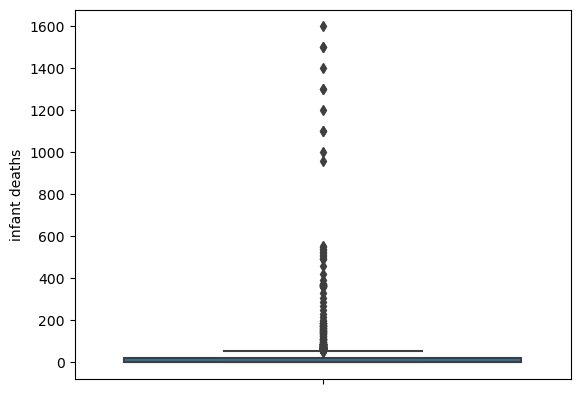

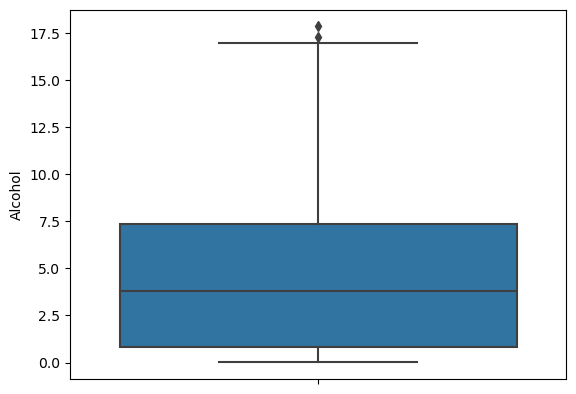

...

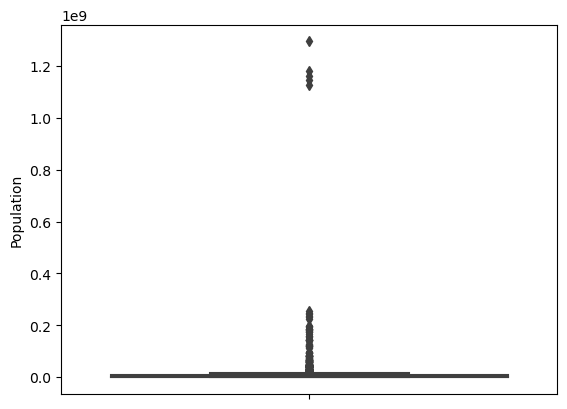

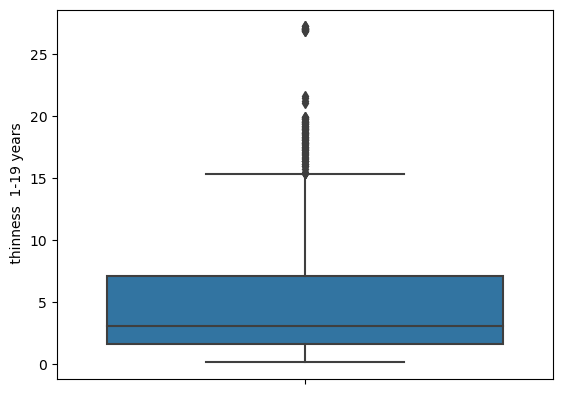

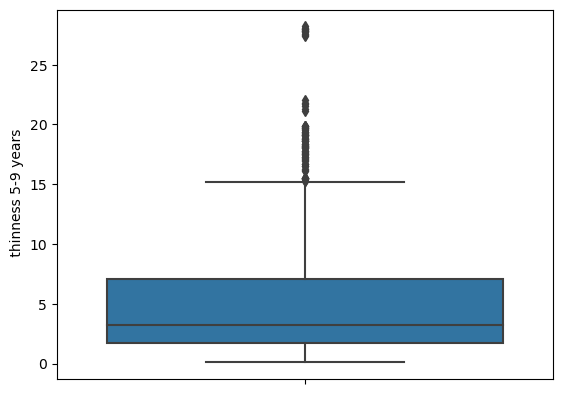

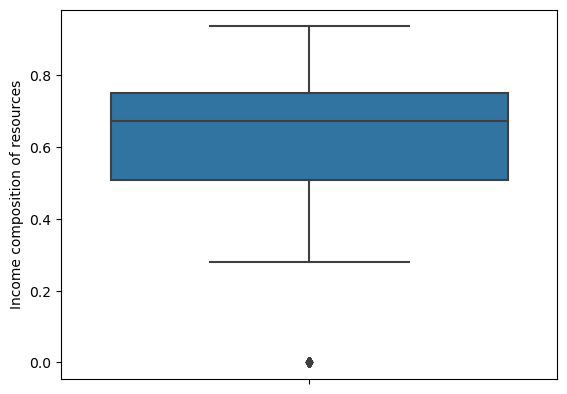

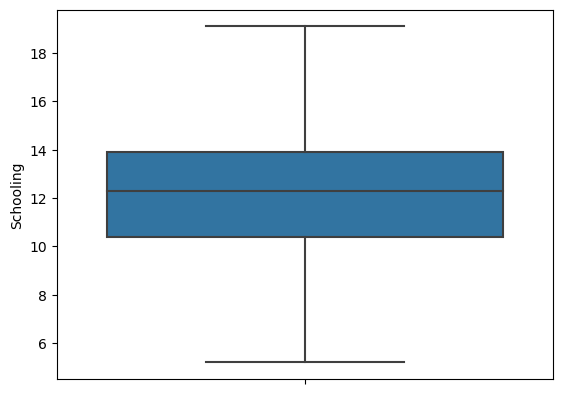

In [13]:
for i in df.columns:
    if df[i].dtypes !='object':
        sns.boxplot(y=df[i])
        plt.show()

### plotting distplot for all columns in the dataset except the categorical columns country and status¶

Note: The number of non binary numerical features is very large (20), please consider splitting the data. Showing plots for the first 20 numerical features. Override this by setting showall=True.


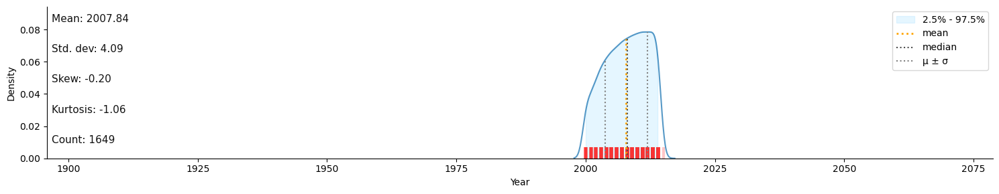

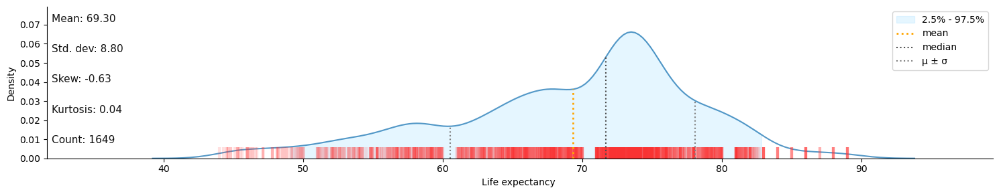

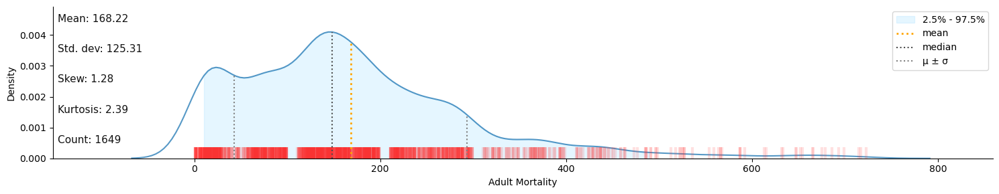

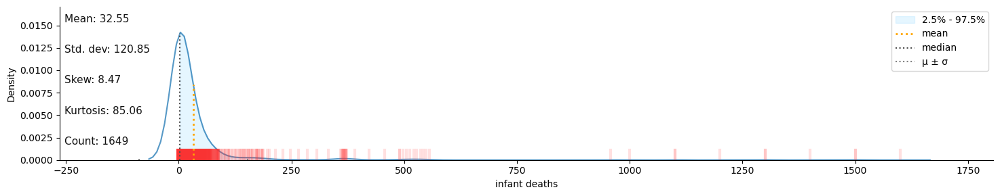

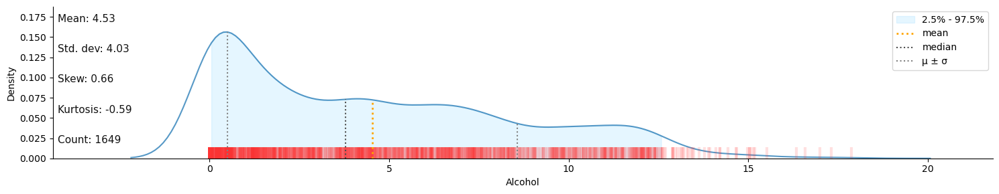

...

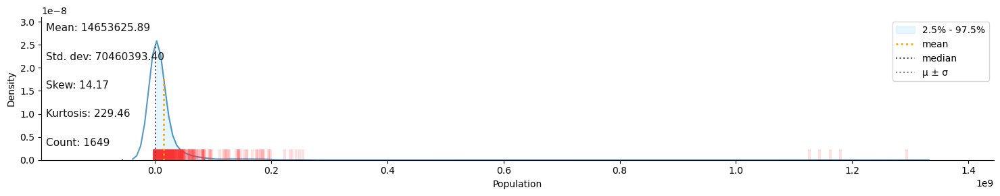

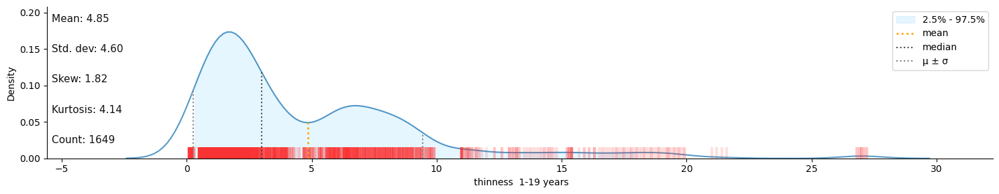

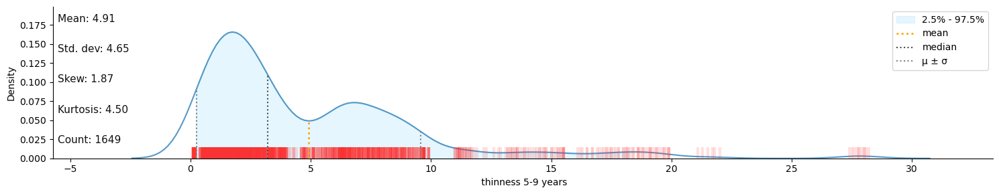

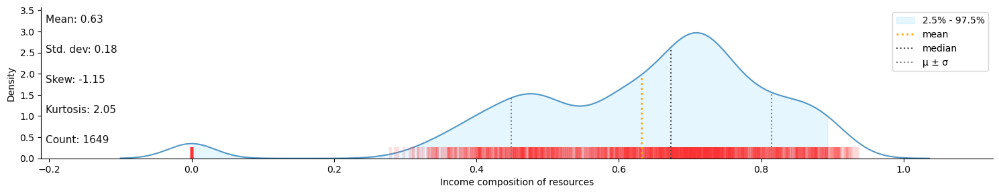

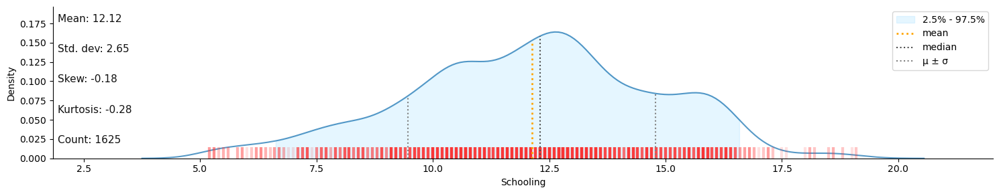

In [14]:
k.dist_plot(data=df);

### AFfter that i find that there are some unimportant outliers which can't be removed fron the dataset.so then i recheck the null values in the dataset

In [15]:
df.isnull().sum()

Country                             0
Year                                0
Status                              0
Life expectancy                     0
Adult Mortality                     0
infant deaths                       0
Alcohol                             0
percentage expenditure              0
Hepatitis B                         0
Measles                             0
 BMI                                0
under-five deaths                   0
Polio                               0
Total expenditure                   0
Diphtheria                          0
 HIV/AIDS                           0
GDP                                 0
Population                          0
 thinness  1-19 years               0
 thinness 5-9 years                 0
Income composition of resources     0
Schooling                          24
dtype: int64

### From the above figure  i made in to the conclusion that there is 24 null values present in the column 'Schooling' so i decided to drop that null value to get more accurate information

In [16]:
df.dropna(inplace=True)

### Then i delete all the space in between the column names by replacing the spaces with underscore 

In [17]:
k.clean_column_names(df)

Long column names detected (>25 characters). Consider renaming the following columns ['income_composition_of_resources'].


,country,year,status,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,...,polio,total_expenditure,diphtheria,hiv_aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


<h1 style="font-size: 25px; color:#000000;text-align: center;
">BIVARIATE ANALYSIS</h1>

### Plotting line plot comparing life_expectancy vs infant_deaths

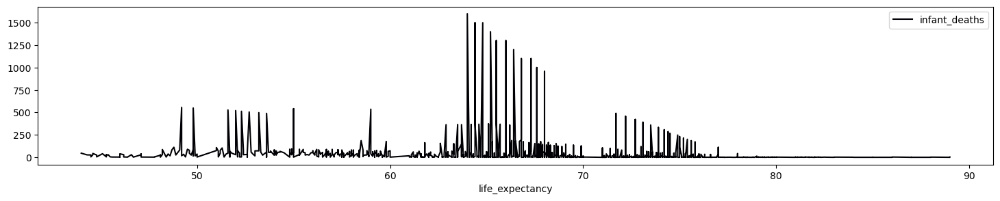

In [18]:
df.sort_values(by='life_expectancy').plot.line('life_expectancy','infant_deaths',figsize=(18,3),cmap='inferno');

### Plotting line plot comparing life_expectancy in  year wise

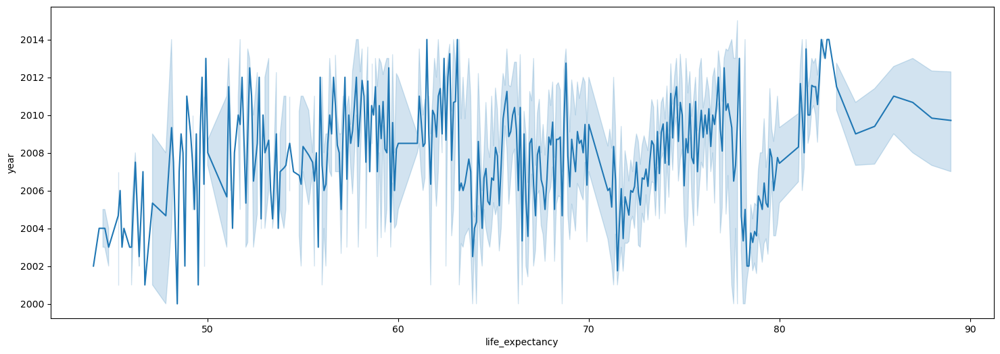

In [19]:
plt.figure(figsize=(18,6))
sns.lineplot(x='life_expectancy', y='year', data=df)
plt.show()

### Then i check which medical status countrys Has High rate of adult_mortality by plotting pie chart

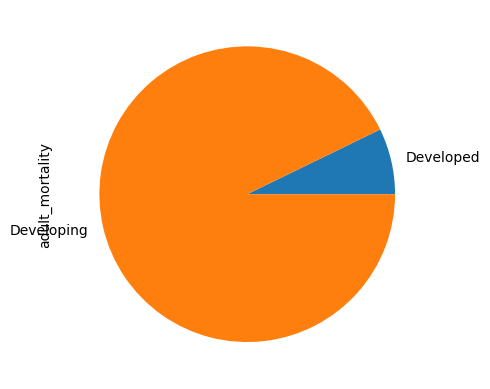

In [20]:
status_adult_mortality = df.groupby(['status'])['adult_mortality'].sum()
status_adult_mortality.plot.pie();

### Then i check which medical status countrys Has High rate of adult_mortality by plotting barplot

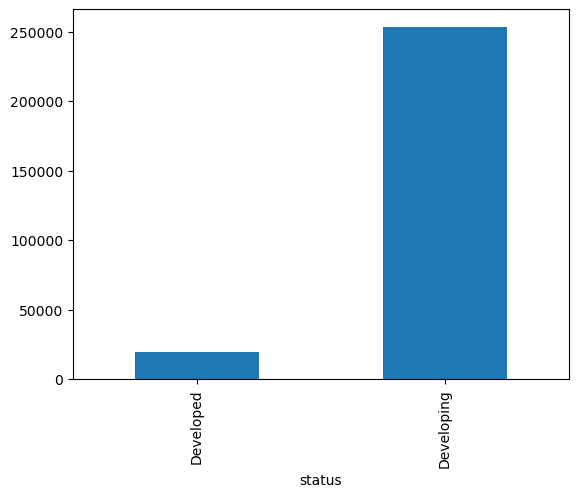

In [21]:
status_adult_mortality.plot.bar();

### from plotted charts i found that Developing statused countrys Have high rate of adult_mortality  and then i plott pairplot of the given dataset to get more accurate information

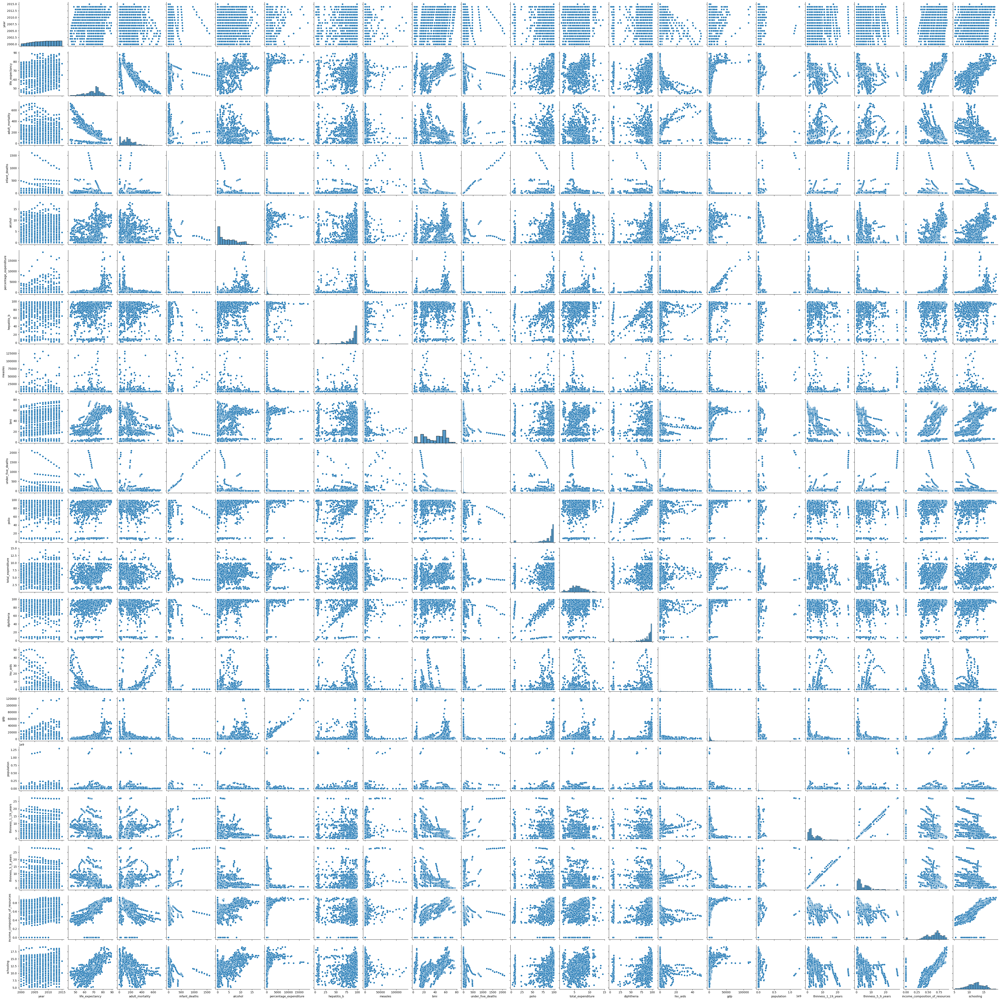

In [22]:
sns.pairplot(data=df)
plt.show()

### Then i check The top 10 countrys from the dataset which have high rate in infant_deaths

In [23]:
country_infant_death = df.groupby(['country'])['infant_deaths'].sum()

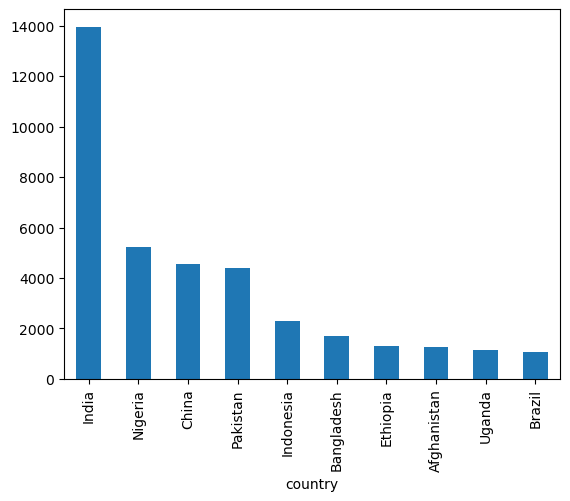

In [24]:
country_infant_death.sort_values(ascending=False)[:10].plot.bar();

### I also find out that the high rate of infant_deaths is in which year 

In [25]:
year_infant_death = df.groupby(['year'])['infant_deaths'].sum()

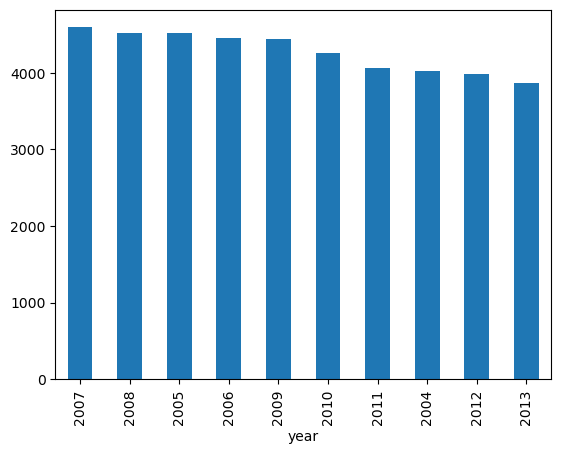

In [26]:
year_infant_death.sort_values(ascending=False)[:10].plot.bar();

### Then i find out the corelation between life_expectancy and year with the help of scatterplot

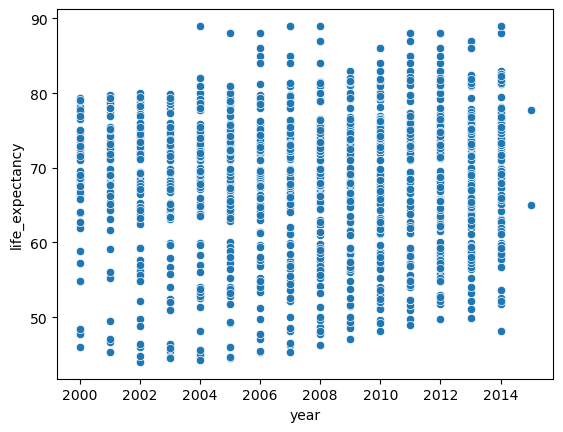

In [27]:
sns.scatterplot(data=df, x='year',y='life_expectancy')
plt.show()

### Then i Use label encoder to get more accurate information and encode country and status columns in to numerical values

In [28]:
le=LabelEncoder()
df["country"]=le.fit_transform(df["country"])
df["status"]=le.fit_transform(df["status"])

### Then use heatmap to plot the corelation in the data 

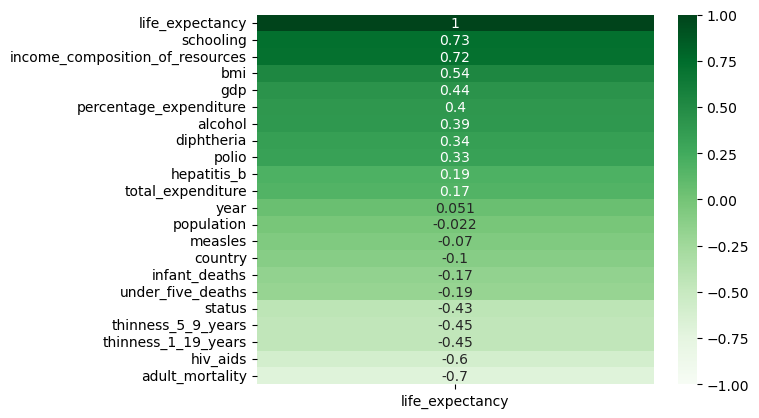

In [29]:
sns.heatmap(df.corr()[["life_expectancy"]].sort_values(by="life_expectancy", ascending=False), vmin=-1, vmax=1,annot=True, cmap="Greens");

### After checking the heatmap i find out that there is high corelated values exist in between bmi,income_composition_of_resources,schooling so i decided to take x vales as this and life_expectancy as y value 

In [30]:
x=df[["bmi","income_composition_of_resources","schooling"]].values
y=df[["life_expectancy"]].values

### Then i use MinMaxScaler for scalling selection and fit it to get best model

In [31]:
sc=MinMaxScaler()

In [32]:
x=sc.fit_transform(x)

In [33]:
models = {
    "LinearRegression": LinearRegression(),
    "Lasso":Lasso(),
    "Ridge":Ridge(),
    "DecisionTreeRegressor":DecisionTreeRegressor(),
    "GradientBoostingRegressor":GradientBoostingRegressor(),
    "AdaBoostRegressor":AdaBoostRegressor(),
    "RandomForestRegressor":RandomForestRegressor(),
    
}

In [34]:
for name, model in models.items():
    scores = cross_val_score(model, x,y, scoring="neg_mean_squared_error",cv=10,n_jobs=-1)
    print("cross validation model : {}".format(name))
    rmse = np.sqrt(-scores)
    rmse_average = np.mean(rmse)
    print("AVERAGE RMSE: ",rmse_average)
    print("*"*100)

cross validation model : LinearRegression
AVERAGE RMSE:  5.558571950684067
****************************************************************************************************
cross validation model : Lasso
AVERAGE RMSE:  7.841224697346708
****************************************************************************************************
cross validation model : Ridge
AVERAGE RMSE:  5.545578234667509
****************************************************************************************************
cross validation model : DecisionTreeRegressor
AVERAGE RMSE:  5.973072186078401
****************************************************************************************************
cross validation model : GradientBoostingRegressor
AVERAGE RMSE:  4.344962735060419
****************************************************************************************************
cross validation model : AdaBoostRegressor
AVERAGE RMSE:  4.546784961258835
****************************************************

### After the scaliing i found out that GradientBoostingRegressor is the best model 

In [35]:
rfr=GradientBoostingRegressor()

### Then applying test and train data

In [36]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

In [37]:
rfr.fit(x_train, y_train)

GradientBoostingRegressor()

In [38]:
print("model trained with {}".format(rfr))
training_score = rfr.score(x_train, y_train)*100
testing_score = rfr.score(x_test, y_test)*100
score = r2_score(y_test, rfr.predict(x_test))*100
mae = mean_absolute_error(y_test, rfr.predict(x_test))
mse = mean_squared_error(y_test, rfr.predict(x_test))
rmse = np.sqrt(mse)
print("r2score: ",score)
print("training_score: ", training_score)
print("testing_score: ", testing_score)
print("mae: ", mae)
print("mse: ", mse)
print("rmse_test: ", rmse)

model trained with GradientBoostingRegressor()
r2score:  82.65895109544822
training_score:  87.3256661714133
testing_score:  82.65895109544822
mae:  2.741149460279445
mse:  12.793098061001455
rmse_test:  3.576744058637891


### After finding out the r2score,training_score,testing_score,mae,mse,rmse_test of the given model GradientBoostingRegressor.And Then i decided to predict the  'y' value

In [39]:
y_pred = rfr.predict(x)

### After predicting the y value i decided to compare it with actual value

In [40]:
OUTPUT = pd.DataFrame(zip(y,y_pred), columns=("ACTUAL", "PREDICTED"), dtype=float)
OUTPUT

,ACTUAL,PREDICTED
0,65.0,60.791522
1,59.9,60.791522
2,59.9,60.791522
3,59.5,58.765975
4,59.2,57.159301
...,...,...
1620,44.3,48.478668
1621,44.5,48.197482
1622,44.8,49.754706
1623,45.3,49.559140


### Then I plott the Actual value vs predicted value with the help of scatterplot 

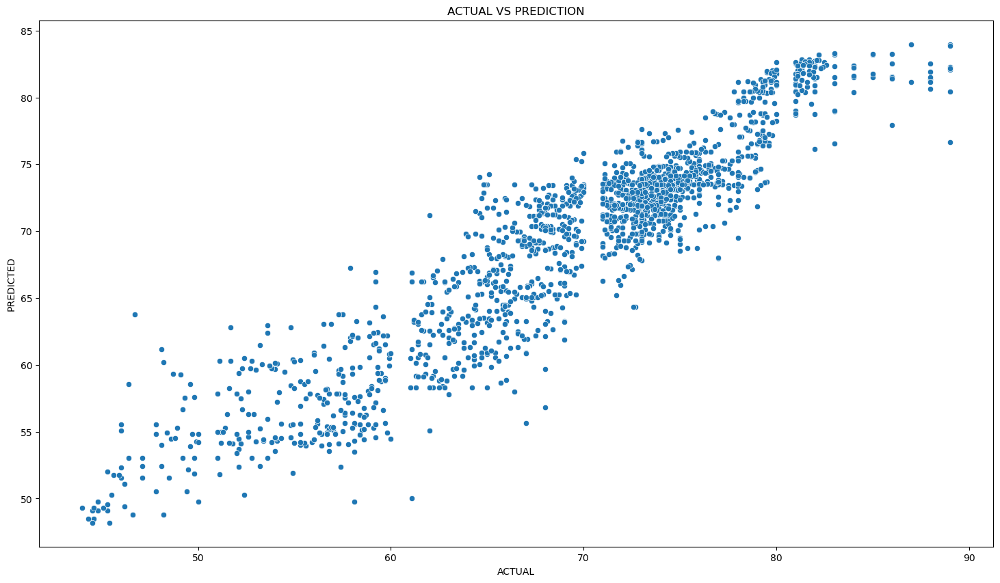

In [41]:
plt.figure(figsize=(18,10))
sns.scatterplot(x='ACTUAL', y='PREDICTED', data=OUTPUT)
plt.title("ACTUAL VS PREDICTION")
plt.show()

## Conclusion

From all the conclusions  i find out that there is a strong corelation existing between the predicted values and actual values.and so the column life_expectency is related with  other varibles in the dataset